Loading data sets

In [ ]:
import zipfile
import os

In [ ]:
zip_path = "/content/train.zip"
extract_dir = "/content/dataset/"

In [ ]:
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
  zip_ref.extractall(extract_dir)


print(extract_dir)

/content/dataset/


In [ ]:
import os

print("Image files:", os.listdir('/content/dataset/train/images')[:5])
print("Label files:", os.listdir('/content/dataset/train/labels')[:5])


Image files: ['gokshura-tabs-tribulus_jpg.rf.fc37565fd000f9c0ab4a7430fda9b24d.jpg', 'whatsapp-image-2023-07-19-at-12-24-08-pm_jpeg.rf.6c1fb3f06de507b066f38efa79f6f30b.jpg', 'aaa_jpeg.rf.21a20e640d145060772dcb4484ad23d9.jpg', 'Unkn-_jpeg.rf.50f989f7965c5fcb21dee2a8b73a50cf.jpg', 'fortune-sunlite-refined-sunflower-cooking-oil-cholesterol-free-346_jpg.rf.4c66edc294eeafc82f84a3423edc4abb.jpg']
Label files: ['51ZLM-t9-yL__UF1000-1000_QL80__jpg.rf.09246a9a34d95e394bdb71c8a4a2d90d.txt', 'download-2_jpg.rf.da357ad6220ea09f0d684d5978081f52.txt', 'wjne_jpeg.rf.5ca97080f0386f4ee3b77438bd6f9461.txt', 'download-3_jpg.rf.d36a53dd790f2ab97f037084d172613c.txt', 'sk_webp.rf.caaca8d3b6ef803688e67265f536ab16.txt']


In [ ]:
import zipfile
import os

In [ ]:
zip_path = "/content/Archive.zip"
extract_dir = "/content/dataset2/"

In [ ]:
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
  zip_ref.extractall(extract_dir)


print(extract_dir)

/content/dataset2/


In [ ]:
path: '/content/dataset2'      # root folder containing train/val/test
train: '/content/dataset2/train/images'
val: '/content/dataset2/valid/images'
#test: test/images            # optional

nc: 1                        # number of classes (only logos)
names: ['logo']              # class names


In [ ]:
# YAML content
yaml_content = """
path: '/content/dataset2'
train: '/content/dataset2/train/images'
val: '/content/dataset2/valid/images'


nc: 1                         # number of classes (only logos)
names: ['logo']               # class names
"""


In [ ]:
with open('/content/dataset.yaml', 'w') as f:
    f.write(yaml_content)

print("dataset.yaml saved successfully!")


dataset.yaml saved successfully!


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 58.4 MB/s eta 0:00:00


Training YOLO model to detect logo

In [ ]:
from ultralytics import YOLO

# Load pretrained YOLOv8
model = YOLO("yolov8n.pt")

# Train using your YAML file
model.train(
    data="/content/dataset.yaml",
    epochs=20,
    imgsz=640,
    batch=4
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.199 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, ko

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79bc835e0320>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 


image 1/1 /content/dataset2/test/images/225x270_png_webp.rf.a43c89bb2607944597eb16dcf86dc889.jpg: 640x640 1 logo, 7.3ms
Speed: 4.1ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


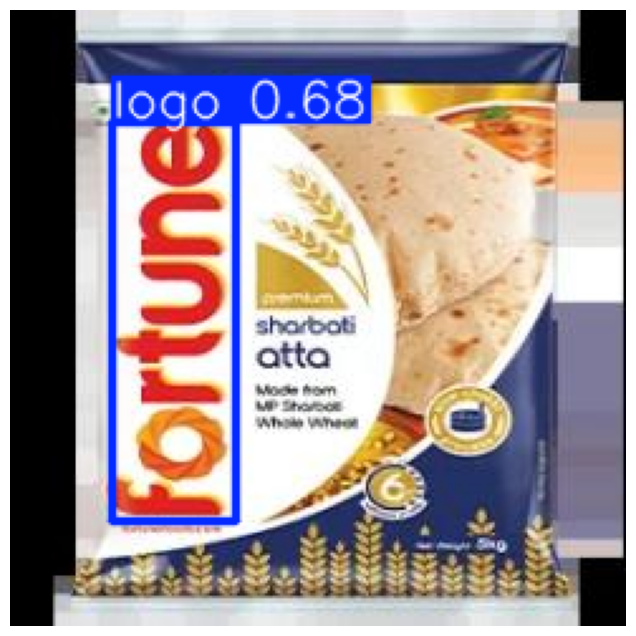

In [ ]:
from matplotlib import pyplot as plt
import cv2

model = YOLO("/content/runs/detect/train/weights/best.pt")


results = model.predict('/content/dataset2/test/images/225x270_png_webp.rf.a43c89bb2607944597eb16dcf86dc889.jpg')

# Visualize predictions
img_with_boxes = results[0].plot()  # returns an array

# Display with matplotlib
plt.figure(figsize=(8,8))
plt.imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

In [ ]:
!zip -r train_weights.zip /content/runs/detect/train/weights/
from google.colab import files
files.download("train_weights.zip")


  adding: content/runs/detect/train/weights/ (stored 0%)
  adding: content/runs/detect/train/weights/best.pt (deflated 10%)
  adding: content/runs/detect/train/weights/last.pt (deflated 10%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


image 1/1 /content/dataset2/test/images/fortune-rich-ban-health-500x500_jpeg_webp.rf.d561832f2bfd343828e686e63edb9354.jpg: 640x640 1 logo, 16.8ms
Speed: 4.5ms preprocess, 16.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


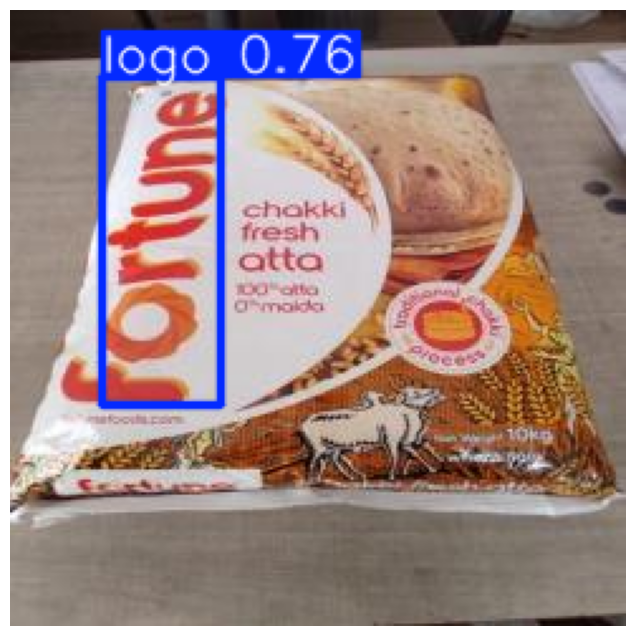


image 1/1 /content/dataset2/test/images/everich-indian-masale-buldhana-buldhana-chilli-wholesalers-60ji7fkanp-250_jpg_webp.rf.2d300137891243e36707b36ad322c56b.jpg: 640x640 4 logos, 10.1ms
Speed: 3.3ms preprocess, 10.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


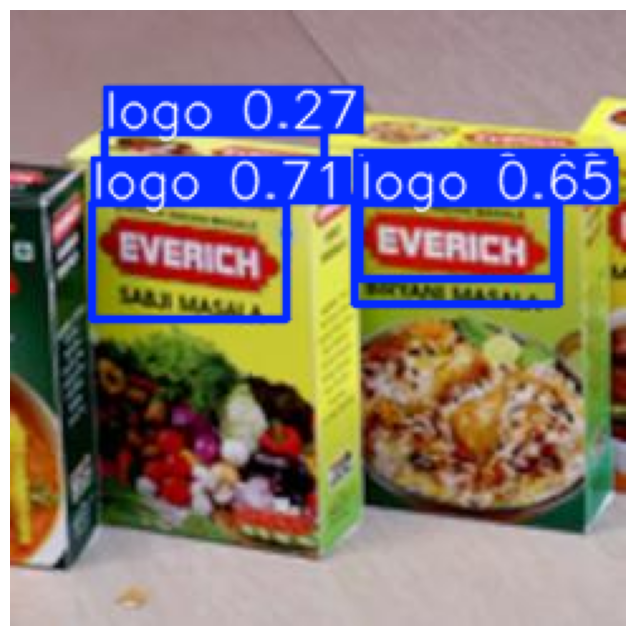


image 1/1 /content/dataset2/test/images/31rVb1hINYL_jpg.rf.92aec05015475270da683e4a67aa2a4d.jpg: 640x640 1 logo, 11.0ms
Speed: 3.1ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


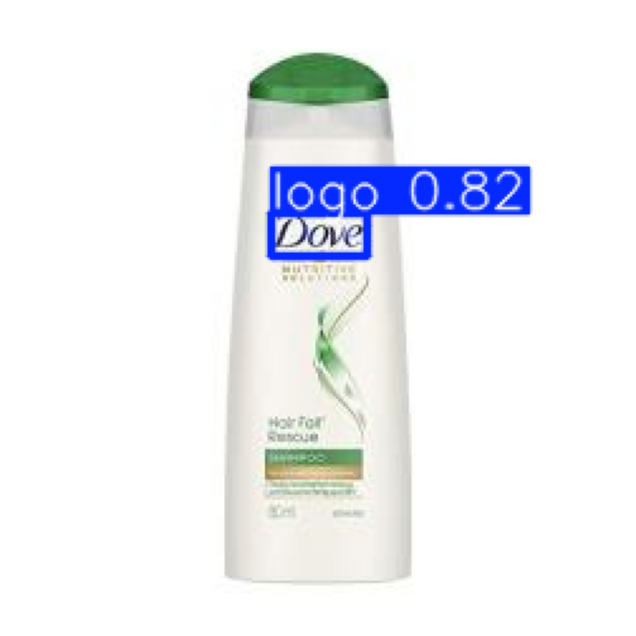


image 1/1 /content/dataset2/test/images/Unknown_png.rf.dd28501ae7c35d6315e26855ab3052e3.jpg: 640x640 1 logo, 9.2ms
Speed: 3.1ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


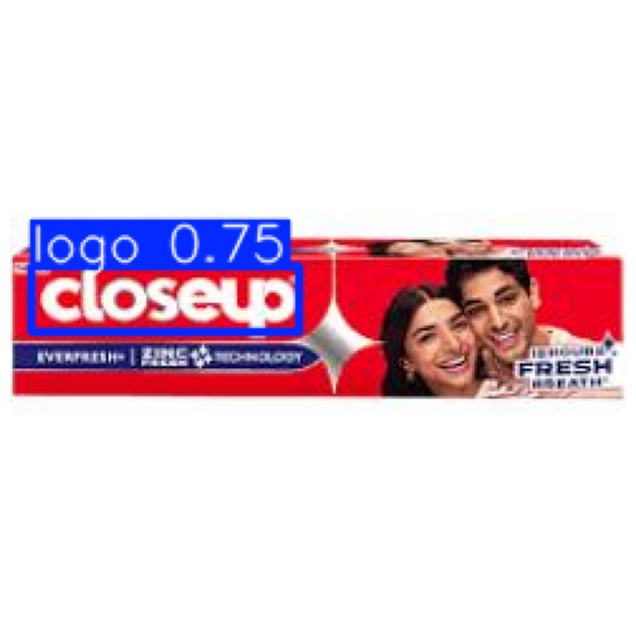


image 1/1 /content/dataset2/test/images/225x270_png_webp.rf.a43c89bb2607944597eb16dcf86dc889.jpg: 640x640 1 logo, 9.5ms
Speed: 4.0ms preprocess, 9.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


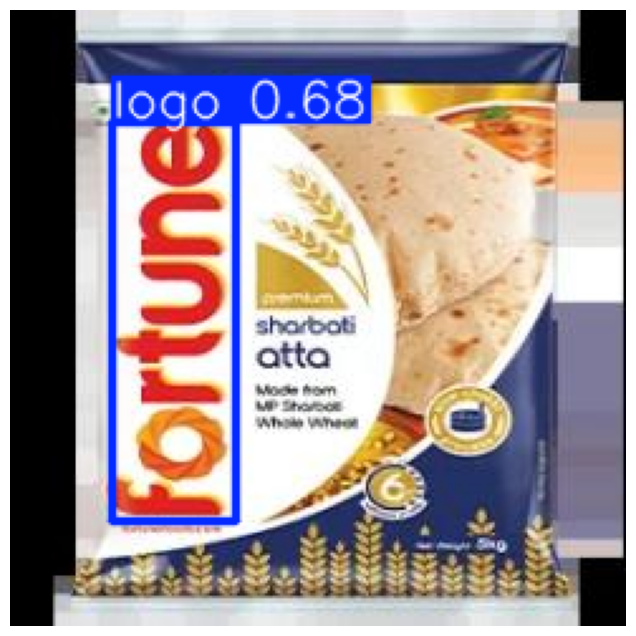


image 1/1 /content/dataset2/test/images/dj_jpeg.rf.959c6f454192fae4c8fbd6de9b85e5ae.jpg: 640x640 2 logos, 9.6ms
Speed: 3.2ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


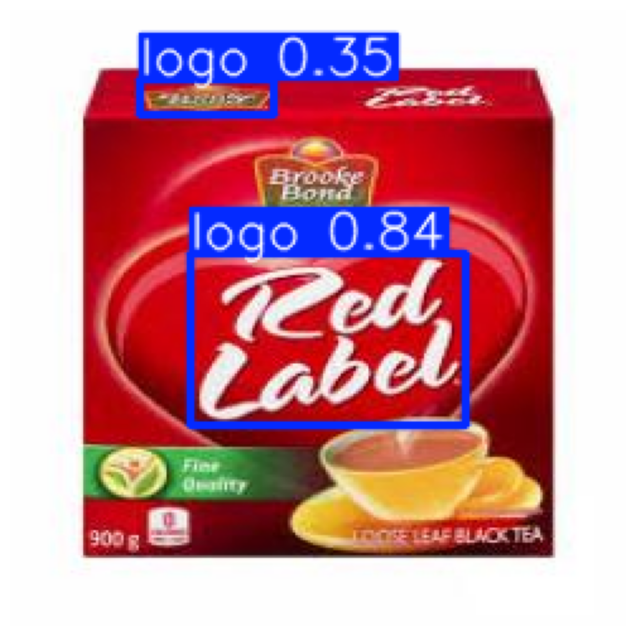


image 1/1 /content/dataset2/test/images/product-647-1-500x500_jpg_webp.rf.ffce5e134a3e65d46d4d75486db265ed.jpg: 640x640 1 logo, 10.1ms
Speed: 3.2ms preprocess, 10.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


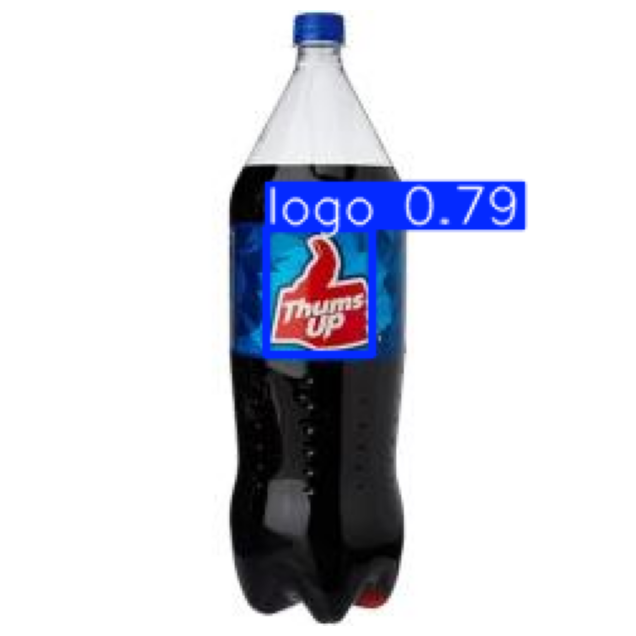


image 1/1 /content/dataset2/test/images/new-product-250x250_jpeg_webp.rf.0fead725fd5b8175738a62622fd74481.jpg: 640x640 3 logos, 8.2ms
Speed: 3.3ms preprocess, 8.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


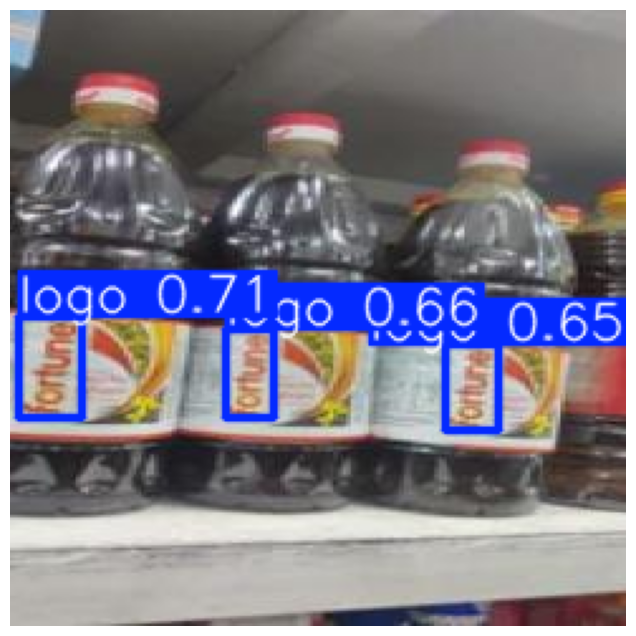


image 1/1 /content/dataset2/test/images/IMG_7068-removebg-preview-1_png_webp.rf.27a33d7efed7b735b06904a5a320e01d.jpg: 640x640 1 logo, 15.3ms
Speed: 3.0ms preprocess, 15.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


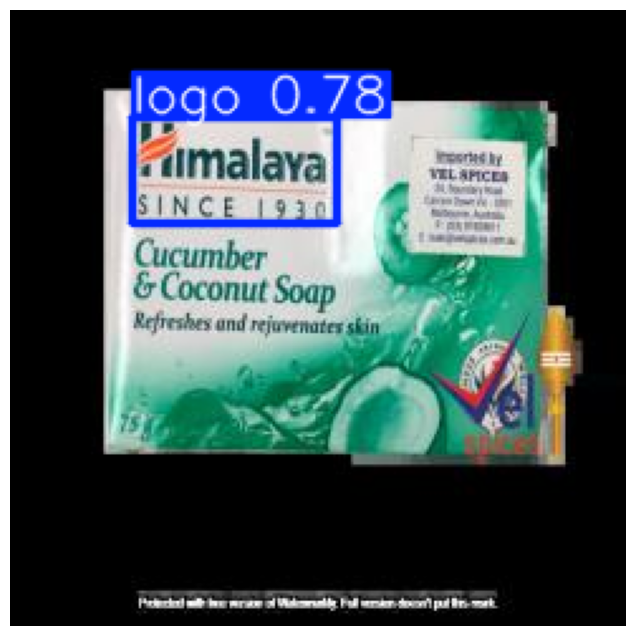


image 1/1 /content/dataset2/test/images/images-24_jpg.rf.ed213881ac5c3ac78a494afc2b1cbf9f.jpg: 640x640 (no detections), 8.5ms
Speed: 3.2ms preprocess, 8.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


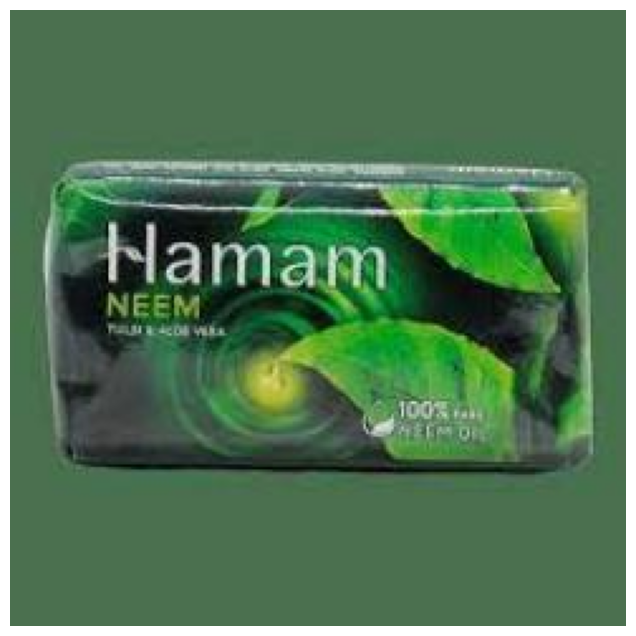


image 1/1 /content/dataset2/test/images/sakd_jpeg.rf.224123e845e163e16cbc64eb5a5a7e14.jpg: 640x640 1 logo, 8.7ms
Speed: 3.2ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


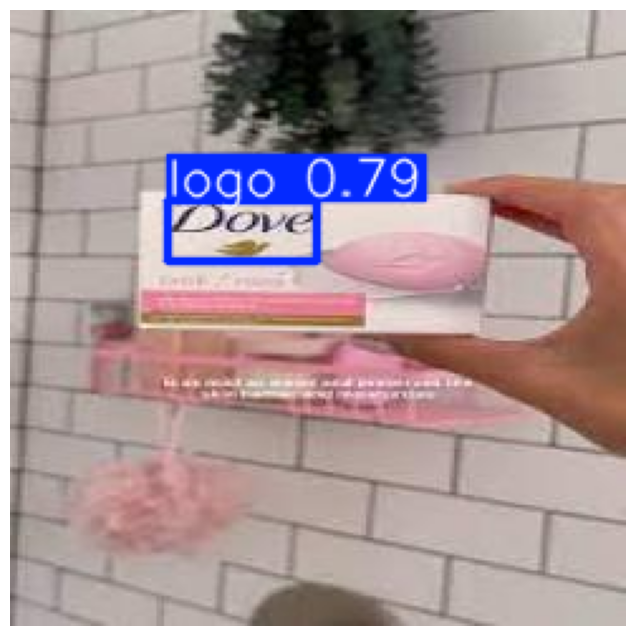


image 1/1 /content/dataset2/test/images/kasn_webp.rf.dd70b10736b7a113c96607ecede897a8.jpg: 640x640 1 logo, 8.5ms
Speed: 3.2ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


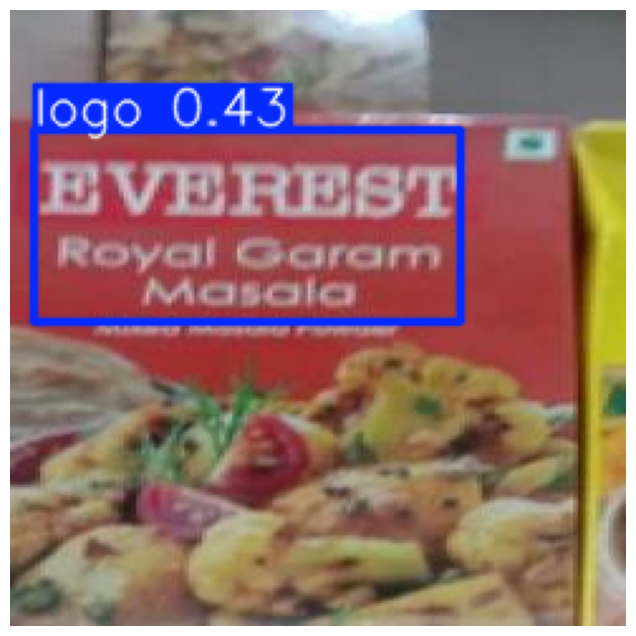


image 1/1 /content/dataset2/test/images/61-uX9axzYL__UF894-1000_QL80__jpg.rf.936c9ecb4ee5e98ee598acc2f7b6efd2.jpg: 640x640 2 logos, 12.4ms
Speed: 3.0ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


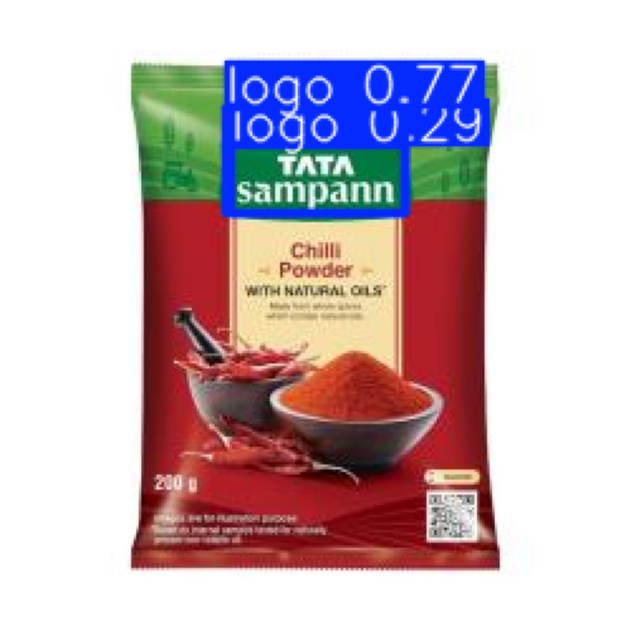


image 1/1 /content/dataset2/test/images/hbvjh_webp.rf.a82b429f57f7d264221b78f3f6921f50.jpg: 640x640 1 logo, 8.8ms
Speed: 3.2ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


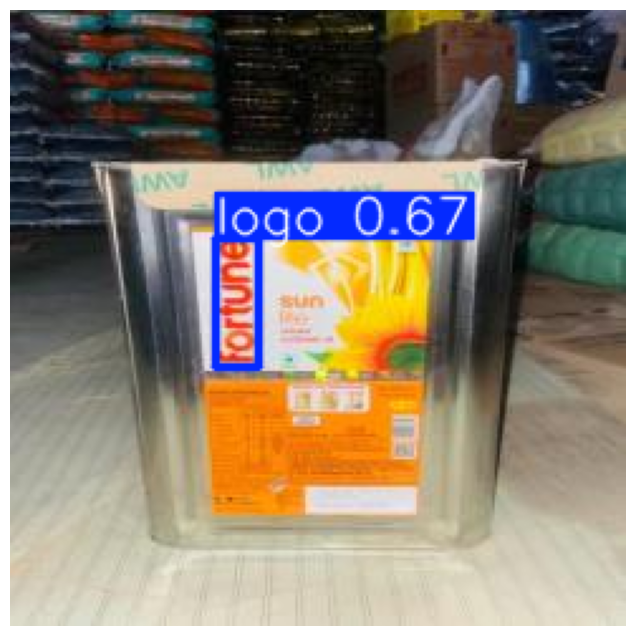


image 1/1 /content/dataset2/test/images/wjne_jpeg.rf.d9ee0c6604ad02a572d88f28ec7faab6.jpg: 640x640 2 logos, 9.2ms
Speed: 3.5ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


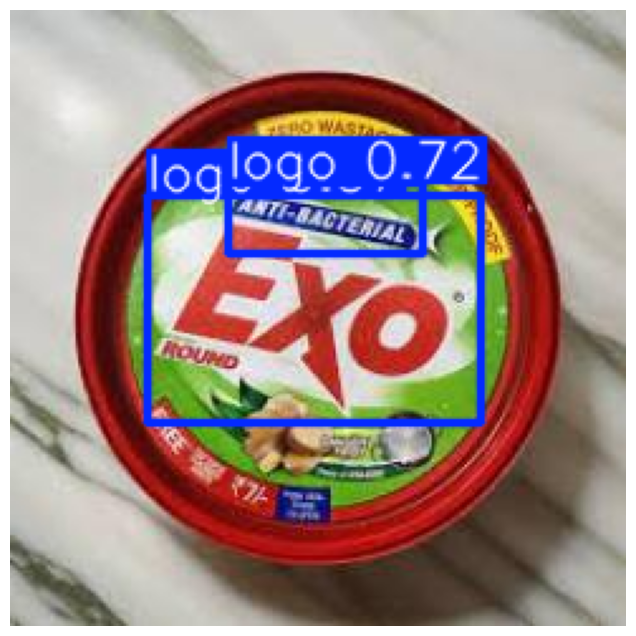


image 1/1 /content/dataset2/test/images/900ml-liquid-dettol-handwash-500x500_jpg_webp.rf.21ffb855ea1ea21d819b404e0615939c.jpg: 640x640 1 logo, 8.6ms
Speed: 3.1ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


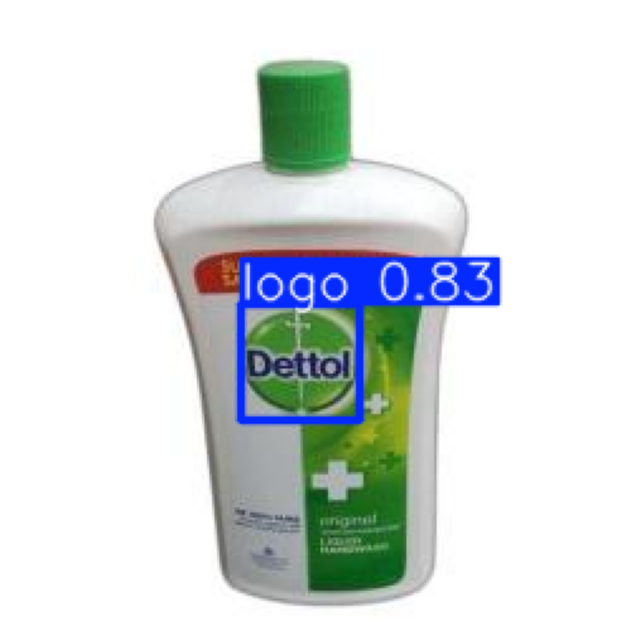


image 1/1 /content/dataset2/test/images/dettol-hand-wash-pump-200ml_jpeg.rf.73183a7280319ddc8f8d33112b53a639.jpg: 640x640 2 logos, 13.1ms
Speed: 3.1ms preprocess, 13.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


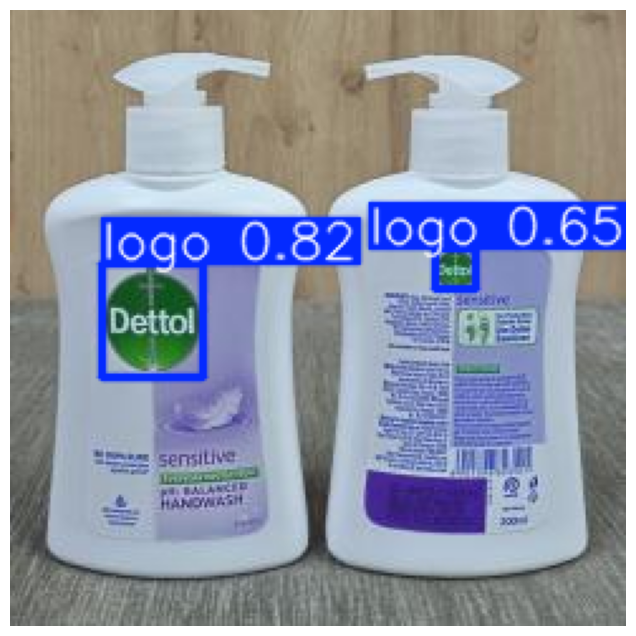


image 1/1 /content/dataset2/test/images/download-6_jpg.rf.fffe20c103cad06870f35ed36bf9b0e8.jpg: 640x640 1 logo, 9.9ms
Speed: 3.4ms preprocess, 9.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


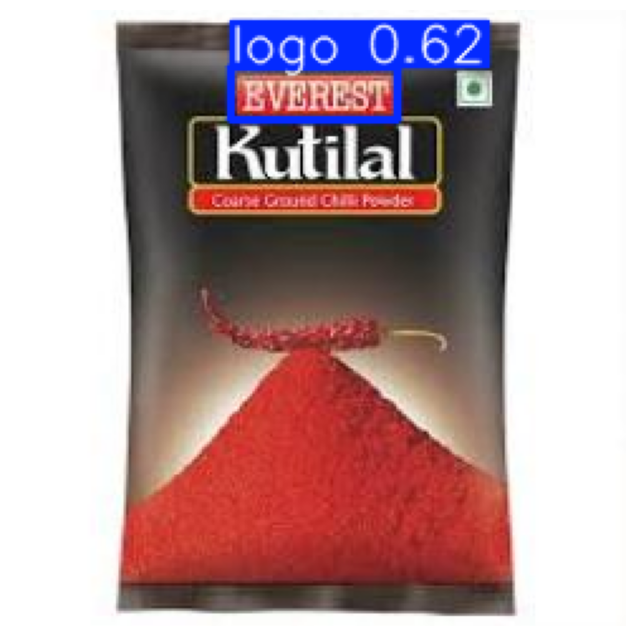


image 1/1 /content/dataset2/test/images/s_jpeg.rf.a19d81a6d2aa8928b8a0dd7323e9fe12.jpg: 640x640 1 logo, 8.9ms
Speed: 3.3ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


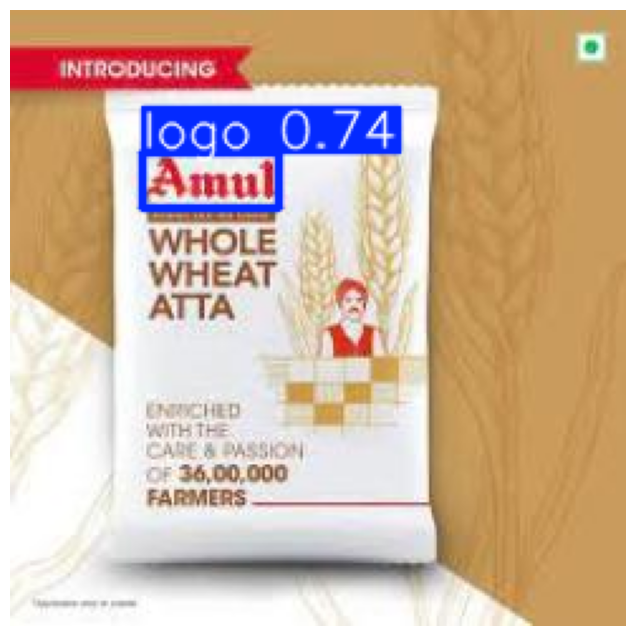


image 1/1 /content/dataset2/test/images/mamaearth-onion-shampoo_jpg.rf.b857f0bcea4701f209f475d470509285.jpg: 640x640 1 logo, 8.7ms
Speed: 3.6ms preprocess, 8.7ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)


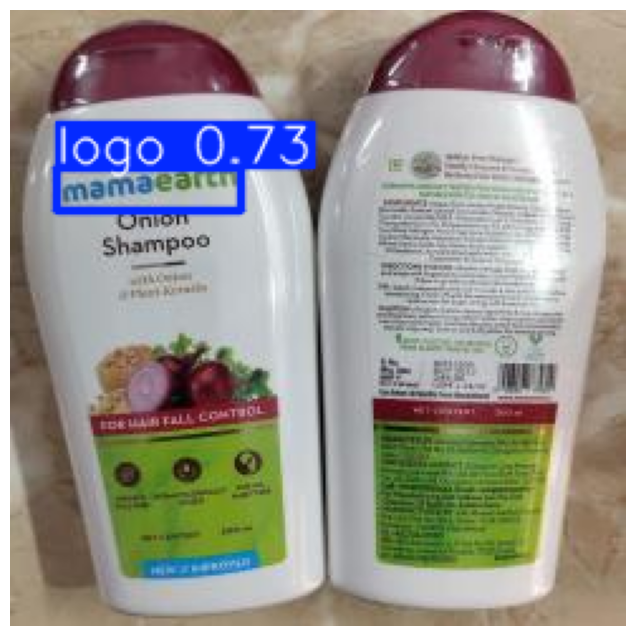


image 1/1 /content/dataset2/test/images/1737028469174_webp.rf.76962c28ed952f820440659d86eaf3f6.jpg: 640x640 1 logo, 11.1ms
Speed: 4.4ms preprocess, 11.1ms inference, 6.7ms postprocess per image at shape (1, 3, 640, 640)


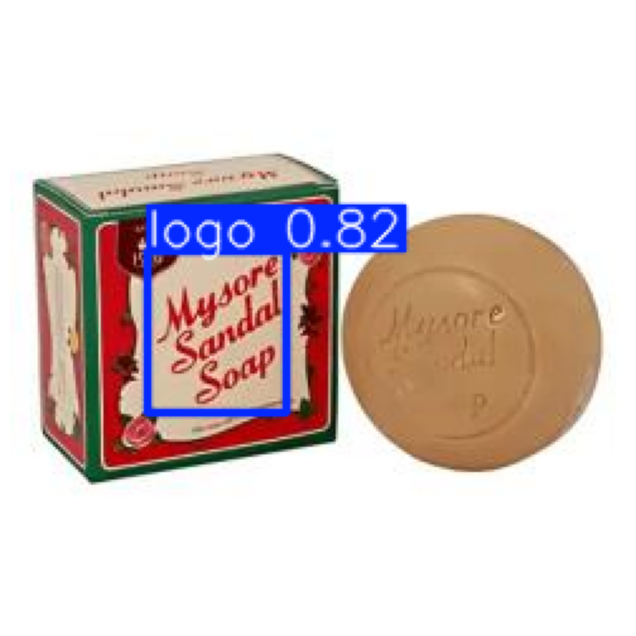


image 1/1 /content/dataset2/test/images/WhatsApp-Image-2024-11-19-at-14_13_13_jpeg.rf.3186a7a4f2579821e41626a145e20f75.jpg: 640x640 1 logo, 8.4ms
Speed: 3.2ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


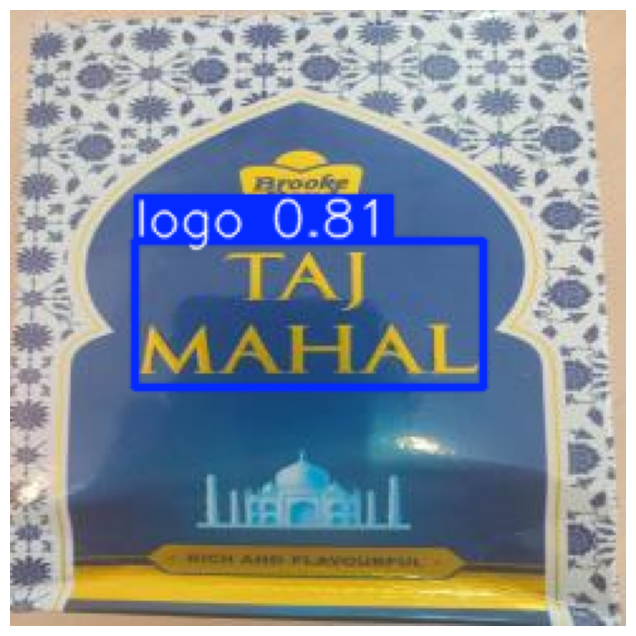


image 1/1 /content/dataset2/test/images/images-10_jpg.rf.a3d56daafe0b549c3be5a4c12da058b7.jpg: 640x640 1 logo, 8.6ms
Speed: 3.3ms preprocess, 8.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


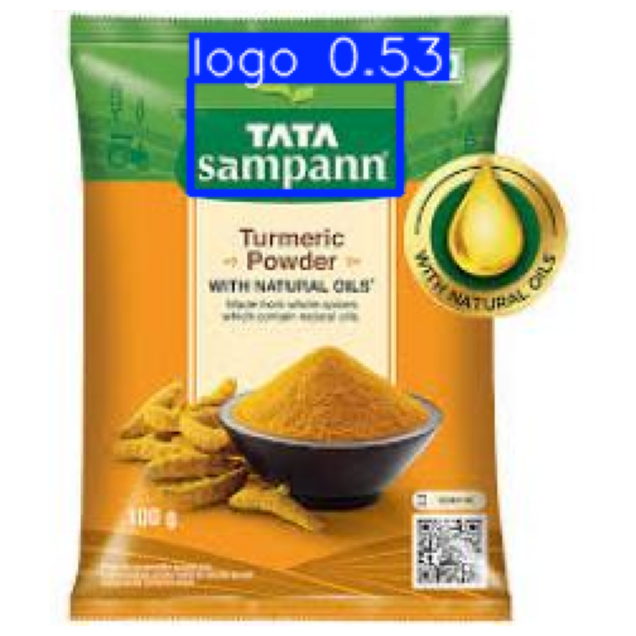


image 1/1 /content/dataset2/test/images/2-6-1024x512_jpg.rf.ae4dbe86e377fc3be7f1f8a7b12e501e.jpg: 640x640 1 logo, 9.3ms
Speed: 3.4ms preprocess, 9.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


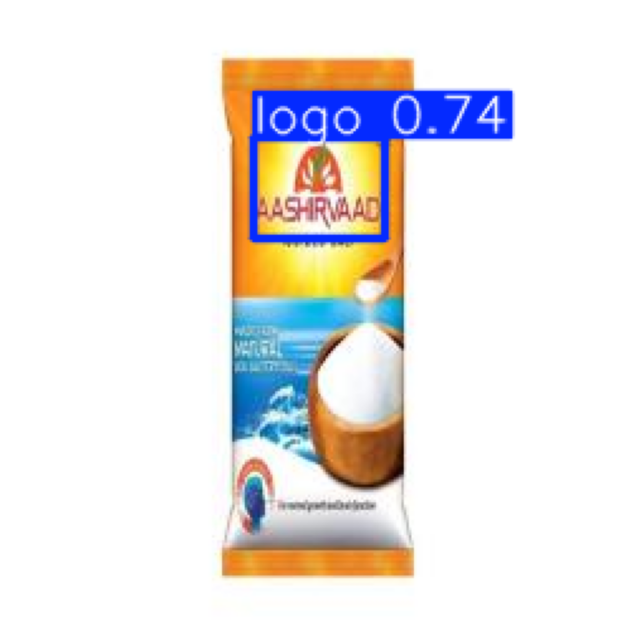


image 1/1 /content/dataset2/test/images/1614845331624-63549928-f015-49c6-a067-984ce2318e93_jpeg_webp.rf.1aa783fd26ada590b216dfc0949be177.jpg: 640x640 1 logo, 7.9ms
Speed: 3.1ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


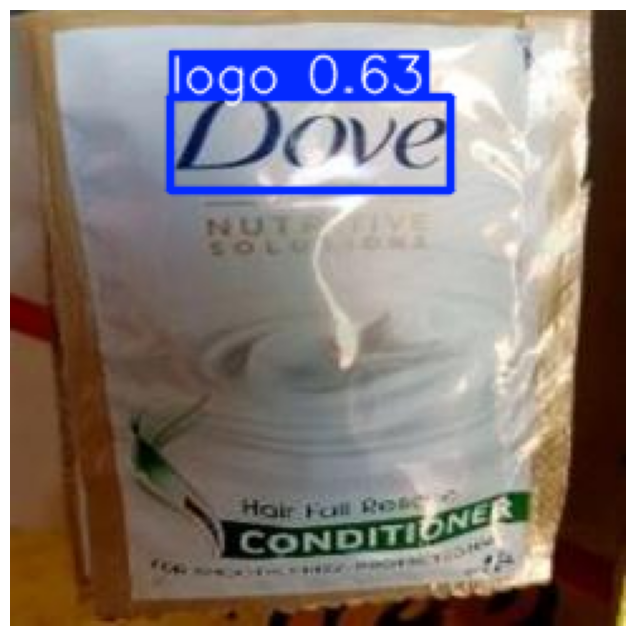


image 1/1 /content/dataset2/test/images/images-16_jpg.rf.c6d2fb0ee935886c1ff5dd73571bd5c0.jpg: 640x640 2 logos, 8.2ms
Speed: 3.2ms preprocess, 8.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


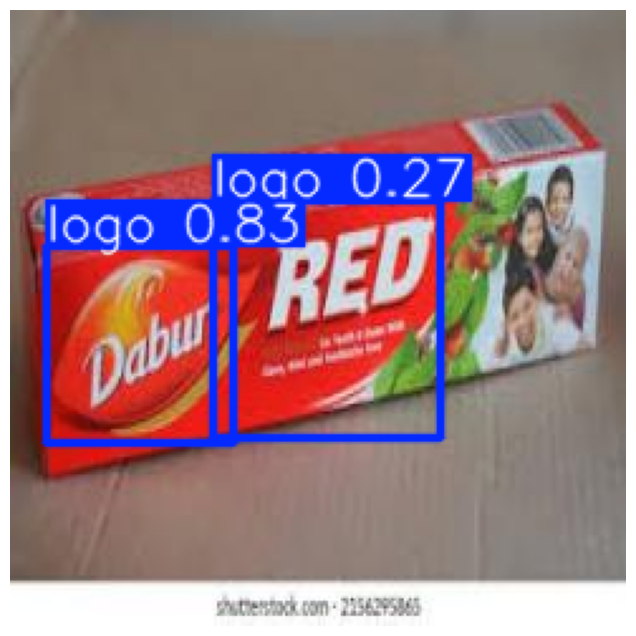


image 1/1 /content/dataset2/test/images/15353690-1709905463166_jpg.rf.b38bdfe39bbba62f94ab7ad6275ef1af.jpg: 640x640 2 logos, 10.3ms
Speed: 6.4ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


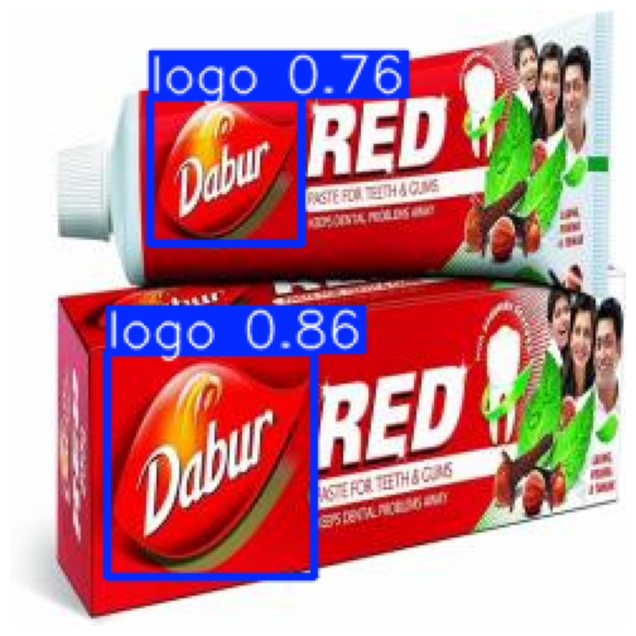

In [ ]:
import os

test_dir = "/content/dataset2/test/images"
for img_file in os.listdir(test_dir):
    if img_file.lower().endswith((".jpg", ".png", ".jpeg")):
        img_path = os.path.join(test_dir, img_file)
        results = model.predict(img_path)
        img_with_boxes = results[0].plot()
        plt.figure(figsize=(8,8))
        plt.imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.show()


In [ ]:
import zipfile
import os

In [ ]:
zip_path = '/content/Archive.zip'
extract_dir = '/content/dataset3/'

In [ ]:
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
  zip_ref.extractall(extract_dir)


print(extract_dir)

/content/dataset3/


Creating fake data set

In [ ]:
import os
import cv2
import random
import shutil

images_dir = "/content/dataset3/train/images"
labels_dir = "/content/dataset3/train/labels"
fake_save_dir = "/content/dataset_fake/"
os.makedirs(fake_save_dir + "images", exist_ok=True)
os.makedirs(fake_save_dir + "labels", exist_ok=True)

def parse_yolo_label(label_file, w, h):
    with open(label_file, "r") as f:
        lines = f.readlines()
    bboxes = []
    for line in lines:
        parts = line.strip().split()
        cls = int(parts[0])
        xc, yc, bw, bh = map(float, parts[1:5])
        # convert to pixel coordinates
        xmin = int((xc - bw/2) * w)
        ymin = int((yc - bh/2) * h)
        xmax = int((xc + bw/2) * w)
        ymax = int((yc + bh/2) * h)
        bboxes.append((xmin, ymin, xmax, ymax))
    return bboxes

def apply_cutout(img, bbox):
    xmin, ymin, xmax, ymax = bbox
    cut_w = (xmax - xmin) // 2
    cut_h = (ymax - ymin) // 2
    cut_x = random.randint(xmin, xmax - cut_w)
    cut_y = random.randint(ymin, ymax - cut_h)
    img[cut_y:cut_y+cut_h, cut_x:cut_x+cut_w] = 0  # black patch
    return img

# Loop over all images
for img_file in os.listdir(images_dir):
    if not img_file.lower().endswith((".jpg", ".png", ".jpeg")):
        continue
    img_path = os.path.join(images_dir, img_file)
    label_path = os.path.join(labels_dir, img_file.rsplit(".",1)[0] + ".txt")

    img = cv2.imread(img_path)
    if img is None or not os.path.exists(label_path):
        continue
    h, w = img.shape[:2]
    bboxes = parse_yolo_label(label_path, w, h)

    fake_img = img.copy()
    for bbox in bboxes:
        fake_img = apply_cutout(fake_img, bbox)

    # Save fake image
    fake_img_name = "fake_" + img_file
    cv2.imwrite(os.path.join(fake_save_dir + "images", fake_img_name), fake_img)

    # Save label file with class 0 (Fake)
    with open(os.path.join(fake_save_dir + "labels", "fake_" + img_file.rsplit(".",1)[0]+".txt"), "w") as f:
        for bbox in bboxes:
            xmin, ymin, xmax, ymax = bbox
            xc = (xmin + xmax) / 2 / w
            yc = (ymin + ymax) / 2 / h
            bw = (xmax - xmin) / w
            bh = (ymax - ymin) / h
            f.write(f"0 {xc} {yc} {bw} {bh}\n")


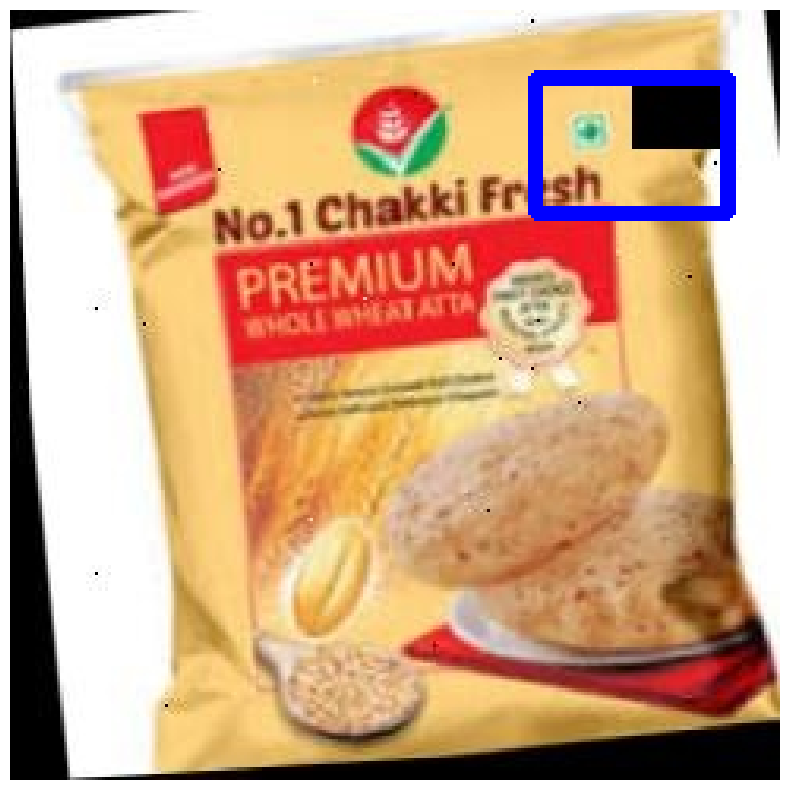

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Path to a sample fake image and label
fake_image_dir = "/content/dataset_fake/images"
fake_label_dir = "/content/dataset_fake/labels"

# Pick a random fake image
fake_img_file = os.listdir(fake_image_dir)[8]  # You can also use random.choice(os.listdir(fake_image_dir))
img_path = os.path.join(fake_image_dir, fake_img_file)
label_path = os.path.join(fake_label_dir, fake_img_file.rsplit(".", 1)[0] + ".txt")

# Load image
img = cv2.imread(img_path)
h, w = img.shape[:2]

# Load label
with open(label_path, 'r') as f:
    lines = f.readlines()

# Plot the image
plt.figure(figsize=(10,10))
for line in lines:
    parts = list(map(float, line.strip().split()))
    cls, xc, yc, bw, bh = parts

    xmin = int((xc - bw/2) * w)
    ymin = int((yc - bh/2) * h)
    xmax = int((xc + bw/2) * w)
    ymax = int((yc + bh/2) * h)

    # Draw bbox (Red box for Fake)
    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (255, 0, 0), 3)

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 10.4 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

logo_model = YOLO("/content/best.pt")  # Your trained weights


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
results = logo_model.predict(source="/content/dataset3/test/images/dettol-hand-wash-pump-200ml_jpeg.rf.73183a7280319ddc8f8d33112b53a639.jpg", conf=0.5, save=False)
pred_bboxes = results[0].boxes.xyxy.cpu().numpy()  # List of predicted [xmin, ymin, xmax, ymax]





image 1/1 /content/dataset3/test/images/dettol-hand-wash-pump-200ml_jpeg.rf.73183a7280319ddc8f8d33112b53a639.jpg: 640x640 2 logos, 227.8ms
Speed: 6.5ms preprocess, 227.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


In [ ]:
def apply_center_cutout_on_predictions(img, pred_bboxes):
    for bbox in pred_bboxes:
        xmin, ymin, xmax, ymax = map(int, bbox)
        bbox_w = xmax - xmin
        bbox_h = ymax - ymin

        cut_w = max(1, int(bbox_w * 0.8))
        cut_h = max(1, int(bbox_h * 0.8))

        cut_x = xmin + (bbox_w - cut_w) // 2
        cut_y = ymin + (bbox_h - cut_h) // 2

        img[cut_y:cut_y+cut_h, cut_x:cut_x+cut_w] = 0
    return img


In [ ]:
import os
import cv2

fake_save_dir = "/content/dataset_fake2/"
os.makedirs(fake_save_dir + "images", exist_ok=True)
os.makedirs(fake_save_dir + "labels", exist_ok=True)

for img_file in os.listdir("/content/dataset3/train/images"):
    img_path = os.path.join("/content/dataset3/train/images", img_file)
    img = cv2.imread(img_path)
    if img is None:
        continue

    results = logo_model.predict(source=img_path, conf=0.5, save=False)
    pred_bboxes = results[0].boxes.xyxy.cpu().numpy()

    if len(pred_bboxes) == 0:
        continue  # Skip images without detected logos

    fake_img = apply_center_cutout_on_predictions(img.copy(), pred_bboxes)

    fake_img_name = "fake_" + img_file
    cv2.imwrite(os.path.join(fake_save_dir + "images", fake_img_name), fake_img)

    # Save predicted bbox + class 0 as label
    h, w = img.shape[:2]
    with open(os.path.join(fake_save_dir + "labels", fake_img_name.rsplit(".",1)[0] + ".txt"), "w") as f:
        for bbox in pred_bboxes:
            xmin, ymin, xmax, ymax = map(int, bbox)
            xc = (xmin + xmax) / 2 / w
            yc = (ymin + ymax) / 2 / h
            bw = (xmax - xmin) / w
            bh = (ymax - ymin) / h
            f.write(f"0 {xc} {yc} {bw} {bh}\n")



image 1/1 /content/dataset3/train/images/whatsapp-image-2024-08-03-at-11-04-06-am-500x500_jpeg_webp.rf.ac67698130ff94b92d1e7ce6e6f57b5b.jpg: 640x640 1 logo, 238.3ms
Speed: 4.5ms preprocess, 238.3ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/dataset3/train/images/81soyncS3HL__AC_UF894-1000_QL80__jpg.rf.bb4f0aa9379f3fa3e0f003f1fbb40da0.jpg: 640x640 (no detections), 223.0ms
Speed: 4.2ms preprocess, 223.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/dataset3/train/images/225x265_Products_0004_FRBH_5Ltr_Front_210618_No-Offer_png_webp.rf.de16ae4e357f89571f3acee5733610cf.jpg: 640x640 1 logo, 237.6ms
Speed: 5.0ms preprocess, 237.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/dataset3/train/images/wsk_jpeg.rf.342ade5348a0210166f0e3e5c3bd3475.jpg: 640x640 1 logo, 230.4ms
Speed: 3.7ms preprocess, 230.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

im


image 1/1 /content/dataset3/test/images/images-16_jpg.rf.c6d2fb0ee935886c1ff5dd73571bd5c0.jpg: 640x640 2 logos, 380.3ms
Speed: 9.3ms preprocess, 380.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


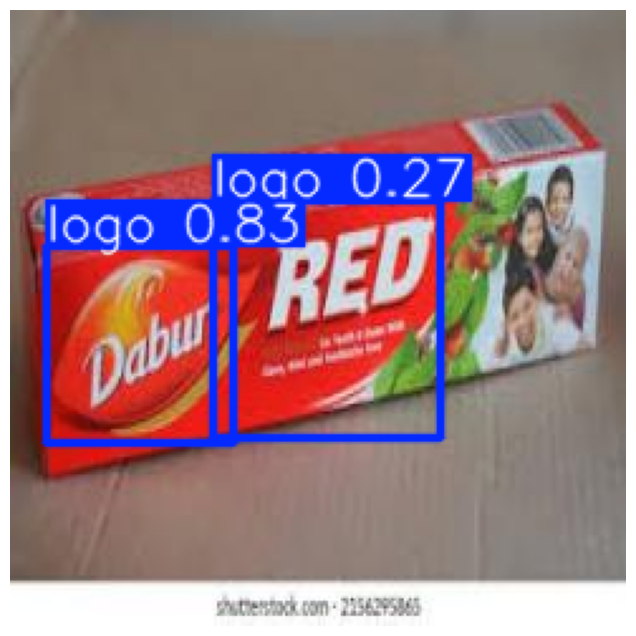

In [ ]:

results = logo_model.predict('/content/dataset3/test/images/images-16_jpg.rf.c6d2fb0ee935886c1ff5dd73571bd5c0.jpg')

# Visualize predictions
img_with_boxes = results[0].plot()


# Display with matplotlib
plt.figure(figsize=(8,8))
plt.imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

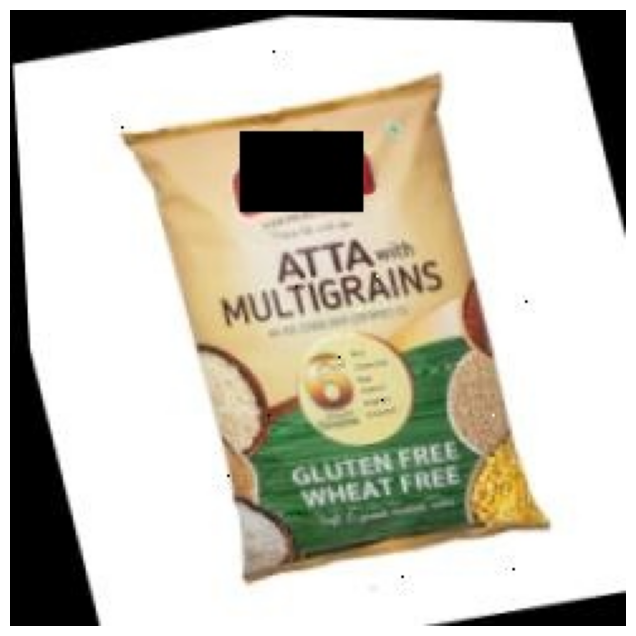

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

img_path = "/content/dataset_fake2/images/fake_61OnmRV01UL__UF1000-1000_QL80__jpg.rf.4ee9fb460b7b6908931d83f1a0e71056.jpg"  # Example fake image path

img = cv2.imread(img_path)

if img is None:
    print("Image not loaded. Check path!")
else:
    # Convert BGR to RGB for matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8,8))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()


In [ ]:
import shutil

shutil.make_archive("/content/dataset_fake2", 'zip', "/content/dataset_fake2")


'/content/dataset_fake2.zip'

In [ ]:
from google.colab import files

files.download("/content/dataset_fake2.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import os
import cv2
import torch
from ultralytics import YOLO

# Paths
images_dir = "/content/dataset3/train/images"
labels_dir = "/content/dataset3/train/labels"
fake_save_dir = "/content/dataset_fake3/"
os.makedirs(fake_save_dir + "images", exist_ok=True)
os.makedirs(fake_save_dir + "labels", exist_ok=True)

# Load logo detection model (replace with your weights path)
logo_model = YOLO("/content/best.pt")

# Apply centered cutout function
def apply_center_cutout_on_predictions(img, pred_bboxes):
    h_img, w_img = img.shape[:2]

    for bbox in pred_bboxes:
        xmin, ymin, xmax, ymax = map(int, bbox)

        bbox_w = xmax - xmin
        bbox_h = ymax - ymin

        cutout_w = bbox_w // 2
        cutout_h = bbox_h // 2

        center_x = xmin + bbox_w // 2
        center_y = ymin + bbox_h // 2

        cut_xmin = max(0, center_x - cutout_w // 2)
        cut_ymin = max(0, center_y - cutout_h // 2)
        cut_xmax = min(w_img, cut_xmin + cutout_w)
        cut_ymax = min(h_img, cut_ymin + cutout_h)

        img[cut_ymin:cut_ymax, cut_xmin:cut_xmax] = 0  # Black patch

    return img

# Process all images
for img_file in os.listdir(images_dir):
    if not img_file.lower().endswith((".jpg", ".png", ".jpeg")):
        continue

    img_path = os.path.join(images_dir, img_file)
    label_path = os.path.join(labels_dir, img_file.rsplit(".",1)[0] + ".txt")

    img = cv2.imread(img_path)
    if img is None or not os.path.exists(label_path):
        continue

    # Step 1: Detect logos
    results = logo_model.predict(source=img_path, conf=0.5, save=False)
    pred_bboxes = results[0].boxes.xyxy.cpu().numpy()

    if len(pred_bboxes) == 0:
        continue  # Skip if no logos detected

    # Step 2: Apply cutout
    fake_img = apply_center_cutout_on_predictions(img.copy(), pred_bboxes)

    # Step 3: Save fake image
    fake_img_name = "fake_" + img_file
    cv2.imwrite(os.path.join(fake_save_dir + "images", fake_img_name), fake_img)

    # Step 4: Save labels (class 0 → Fake)
    h, w = img.shape[:2]
    with open(os.path.join(fake_save_dir + "labels", fake_img_name.rsplit(".",1)[0] + ".txt"), "w") as f:
        for bbox in pred_bboxes:
            xmin, ymin, xmax, ymax = map(int, bbox)
            xc = (xmin + xmax) / 2 / w
            yc = (ymin + ymax) / 2 / h
            bw = (xmax - xmin) / w
            bh = (ymax - ymin) / h
            f.write(f"0 {xc} {yc} {bw} {bh}\n")

    print(f"Saved fake image and label: {fake_img_name}")



image 1/1 /content/dataset3/train/images/whatsapp-image-2024-08-03-at-11-04-06-am-500x500_jpeg_webp.rf.ac67698130ff94b92d1e7ce6e6f57b5b.jpg: 640x640 1 logo, 238.5ms
Speed: 8.1ms preprocess, 238.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Saved fake image and label: fake_whatsapp-image-2024-08-03-at-11-04-06-am-500x500_jpeg_webp.rf.ac67698130ff94b92d1e7ce6e6f57b5b.jpg

image 1/1 /content/dataset3/train/images/81soyncS3HL__AC_UF894-1000_QL80__jpg.rf.bb4f0aa9379f3fa3e0f003f1fbb40da0.jpg: 640x640 (no detections), 372.9ms
Speed: 7.7ms preprocess, 372.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/dataset3/train/images/225x265_Products_0004_FRBH_5Ltr_Front_210618_No-Offer_png_webp.rf.de16ae4e357f89571f3acee5733610cf.jpg: 640x640 1 logo, 239.2ms
Speed: 9.2ms preprocess, 239.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
Saved fake image and label: fake_225x265_Products_0004_FRBH_5Ltr_Front_210618_No-Offe

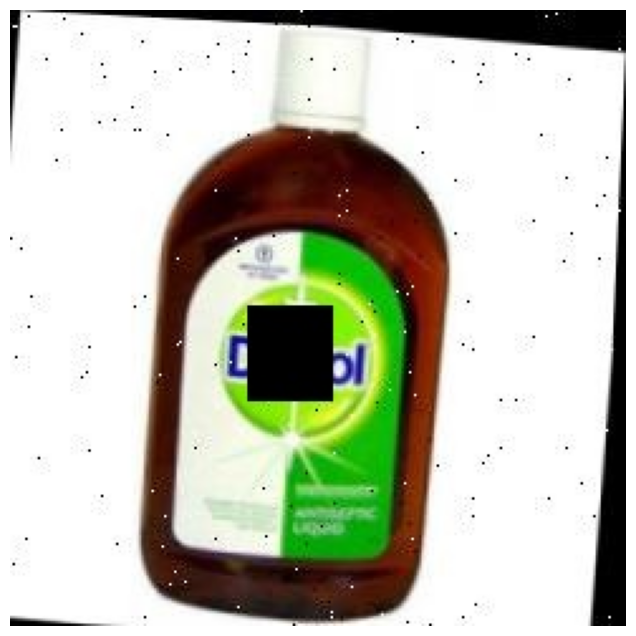

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

img_path = "/content/dataset_fake3/images/fake_10640-500x500_jpeg.rf.53adcd93abd412a0c416462e492a6211.jpg"  # Example fake image path

img = cv2.imread(img_path)

if img is None:
    print("Image not loaded. Check path!")
else:
    # Convert BGR to RGB for matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8,8))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

In [ ]:
import shutil

shutil.make_archive("/content/dataset_fake3", 'zip', "/content/dataset_fake3")


'/content/dataset_fake3.zip'

In [ ]:
from google.colab import files

files.download("/content/dataset_fake3.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 30.3 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
import cv2

logo_model = YOLO("/content/best.pt")

def detect_logo_and_crop(img_path):
    results = logo_model.predict(source=img_path, conf=0.5, save=False)
    pred_bboxes = results[0].boxes.xyxy.cpu().numpy()

    if len(pred_bboxes) == 0:
        return None  # No logo detected

    # Take first detected logo (or loop over all)
    xmin, ymin, xmax, ymax = map(int, pred_bboxes[0])
    img = cv2.imread(img_path)
    cropped_logo = img[ymin:ymax, xmin:xmax]

    return cropped_logo


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
import zipfile
import os

In [ ]:
zip_path = '/content/Archive.zip'
extract_dir = '/content/dataset_real/'

In [ ]:
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
  zip_ref.extractall(extract_dir)


print(extract_dir)

/content/dataset_real/


In [ ]:
zip_path = '/content/dataset_fake3.zip'
extract_dir = '/content/dataset_fake/'

In [ ]:
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
  zip_ref.extractall(extract_dir)


print(extract_dir)

/content/dataset_fake/


Extracting logo for training

In [ ]:
import numpy as np
import os

data = []
labels = []

# Process Real Images
real_images_dir = "/content/dataset_real/train/images" # corrected path
for img_file in os.listdir(real_images_dir):
    img_path = os.path.join(real_images_dir, img_file)
    cropped_logo = detect_logo_and_crop(img_path)
    if cropped_logo is not None: # Check if logo was detected before processing
        data.append(cv2.resize(cropped_logo, (128, 128)))  # Resize to fixed size
        labels.append(1)  # Real

# Process Fake Images
fake_images_dir = "/content/dataset_fake/images" # corrected path
for img_file in os.listdir(fake_images_dir):
    img_path = os.path.join(fake_images_dir, img_file)
    cropped_logo = detect_logo_and_crop(img_path)
    if cropped_logo is not None: # Check if logo was detected before processing
        data.append(cv2.resize(cropped_logo, (128, 128)))  # Resize to fixed size
        labels.append(0)  # Fake

data = np.array(data) / 255.0  # Normalize
labels = np.array(labels)


image 1/1 /content/dataset_real/train/images/14513985-product-1733999407903-500x500_jpg_webp.rf.b6ca7efaa377b38975aca10694ca383a.jpg: 640x640 (no detections), 7.3ms
Speed: 14.0ms preprocess, 7.3ms inference, 87.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/dataset_real/train/images/download_jpg.rf.d1d6a14cfb19a7d86cfc28b663b81d50.jpg: 640x640 1 logo, 7.3ms
Speed: 3.6ms preprocess, 7.3ms inference, 210.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/dataset_real/train/images/download-7_jpg.rf.179aadfad816c6ad2768bd94206a9ba8.jpg: 640x640 1 logo, 7.3ms
Speed: 3.4ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/dataset_real/train/images/Gokshura-60caplets-4_jpg_webp.rf.bace960e92b02927f3ea19be15ab5f4f.jpg: 640x640 2 logos, 7.2ms
Speed: 2.4ms preprocess, 7.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/dataset_real/train/images/n_jpeg.rf.0f0d

Traning model-1

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset


In [ ]:
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(64 * 32 * 32, 128)  # Assuming input size is 128x128
        self.fc2 = nn.Linear(128, 1)  # Binary classification

    def forward(self, x):
        x = self.pool(torch.relu(self.conv1(x)))
        x = self.pool(torch.relu(self.conv2(x)))
        x = self.flatten(x)
        x = torch.relu(self.fc1(x))
        x = torch.sigmoid(self.fc2(x))  # Output between 0 and 1
        return x


In [ ]:
import numpy as np
import torch

# Convert data and labels to tensors
data_tensor = torch.tensor(data, dtype=torch.float32).permute(0, 3, 1, 2)  # Shape: (N, 3, 128, 128)
labels_tensor = torch.tensor(labels, dtype=torch.float32).unsqueeze(1)  # Shape: (N, 1)

# Create Dataset and DataLoader
dataset = TensorDataset(data_tensor, labels_tensor)
train_loader = DataLoader(dataset, batch_size=16, shuffle=True)


In [ ]:
model = SimpleCNN()
optimizer = optim.Adam(model.parameters(), lr=0.001)
criterion = nn.BCELoss()


In [ ]:
num_epochs = 10

for epoch in range(num_epochs):
    running_loss = 0.0
    correct = 0
    total = 0

    for inputs, targets in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        predicted = (outputs > 0.5).float()
        correct += (predicted == targets).sum().item()
        total += targets.size(0)

    accuracy = correct / total
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss:.4f}, Accuracy: {accuracy:.4f}")


Epoch [1/10], Loss: 11.9771, Accuracy: 0.9610
Epoch [2/10], Loss: 6.5874, Accuracy: 0.9710
Epoch [3/10], Loss: 5.7256, Accuracy: 0.9736
Epoch [4/10], Loss: 6.0129, Accuracy: 0.9761
Epoch [5/10], Loss: 4.1280, Accuracy: 0.9798
Epoch [6/10], Loss: 3.6694, Accuracy: 0.9849
Epoch [7/10], Loss: 3.5663, Accuracy: 0.9824
Epoch [8/10], Loss: 49.2272, Accuracy: 0.9685
Epoch [9/10], Loss: 4.8265, Accuracy: 0.9786
Epoch [10/10], Loss: 3.1590, Accuracy: 0.9887


In [ ]:
def detect_and_classify(img_path):
    results = logo_model.predict(source=img_path, conf=0.5, save=False)
    pred_bboxes = results[0].boxes.xyxy.cpu().numpy()

    if len(pred_bboxes) == 0:
        return "No logo detected"

    xmin, ymin, xmax, ymax = map(int, pred_bboxes[0])
    img = cv2.imread(img_path)
    cropped_logo = img[ymin:ymax, xmin:xmax]

    if cropped_logo.size == 0:
        return "Failed to crop logo"

    img_resized = cv2.resize(cropped_logo, (128, 128)) / 255.0
    img_tensor = torch.tensor(img_resized).permute(2,0,1).unsqueeze(0).float()

    with torch.no_grad():
        prob = model(img_tensor).item()

    label = "Real" if prob > 0.5 else "Fake"
    confidence = prob if prob > 0.5 else 1 - prob
    return f"Prediction: {label}, Confidence: {confidence:.2f}"


In [ ]:
import matplotlib.pyplot as plt
import cv2

def detect_and_classify_with_display(img_path):
    results = logo_model.predict(source=img_path, conf=0.5, save=False)
    pred_bboxes = results[0].boxes.xyxy.cpu().numpy()

    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if len(pred_bboxes) == 0:
        plt.imshow(img_rgb)
        plt.axis('off')
        plt.title("No logo detected fake")
        plt.show()
        return "No logo detected fake"

    xmin, ymin, xmax, ymax = map(int, pred_bboxes[0])
    cropped_logo = img[ymin:ymax, xmin:xmax]

    if cropped_logo.size == 0:
        plt.imshow(img_rgb)
        plt.axis('off')
        plt.title("Failed to crop logo")
        plt.show()
        return "Failed to crop logo"

    img_resized = cv2.resize(cropped_logo, (128, 128)) / 255.0
    img_tensor = torch.tensor(img_resized).permute(2,0,1).unsqueeze(0).float()

    with torch.no_grad():
        prob = model(img_tensor).item()

    label = "Real" if prob > 0.5 else "Fake"
    confidence = prob if prob > 0.5 else 1 - prob

    # Draw bounding box on original image
    cv2.rectangle(img_rgb, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)

    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(f"{label} ({confidence:.2f})")
    plt.show()

    return f"Prediction: {label}, Confidence: {confidence:.2f}"



image 1/1 /content/dataset_fake/images/fake_000bc723-c030-4f2e-98ab-2969cc59d75d_png_jpeg.rf.b45e3d681d4c16d8792ba5d303348c16.jpg: 640x640 (no detections), 8.8ms
Speed: 2.9ms preprocess, 8.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


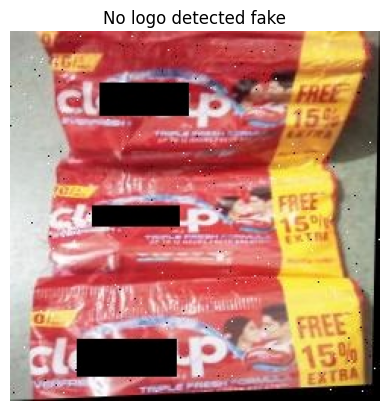

No logo detected fake


In [ ]:
test_image_path = "/content/dataset_fake/images/fake_000bc723-c030-4f2e-98ab-2969cc59d75d_png_jpeg.rf.b45e3d681d4c16d8792ba5d303348c16.jpg"
result = detect_and_classify_with_display(test_image_path)
print(result)


In [ ]:
test_image_path = "/content/dataset_fake/images/fake_0027660_pillsbury-chakki-fresh-atta-10kg_360_jpg.rf.94f3efd3043051a49e073f9a0964a836.jpg"
print(detect_and_classify(test_image_path))



image 1/1 /content/dataset_fake/images/fake_0027660_pillsbury-chakki-fresh-atta-10kg_360_jpg.rf.94f3efd3043051a49e073f9a0964a836.jpg: 640x640 1 logo, 8.7ms
Speed: 3.3ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Prediction: Fake, Confidence: 0.75


In [ ]:
import zipfile
import os

zip_path = '/content/test_imagfak.zip'
extract_dir = '/content/test_imag2/'


with zipfile.ZipFile(zip_path, 'r') as zip_ref:
  zip_ref.extractall(extract_dir)


print(extract_dir)

/content/test_imag2/


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader

class LogoDataset(Dataset):
    def __init__(self, data, labels):
        self.data = torch.tensor(data, dtype=torch.float32).permute(0, 3, 1, 2)  # [N, 3, 128, 128]
        self.labels = torch.tensor(labels, dtype=torch.float32).unsqueeze(1)  # [N, 1]

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx], self.labels[idx]


Traning model-2

In [ ]:
import torch.nn as nn
import torchvision.models as models

# Load pretrained ResNet18
model = models.resnet18(pretrained=True)

# Freeze early layers to prevent full retraining
for param in model.parameters():
    param.requires_grad = False

# Replace final layer for binary classification
model.fc = nn.Sequential(
    nn.Linear(model.fc.in_features, 1),
    nn.Sigmoid()  # Because it's binary classification
)


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 178MB/s]


In [ ]:
from sklearn.model_selection import train_test_split

# Split data into train/test
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42)

train_dataset = LogoDataset(X_train, y_train)
test_dataset = LogoDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)


In [ ]:
import torch.optim as optim

criterion = nn.BCELoss()
optimizer = optim.Adam(model.fc.parameters(), lr=1e-4)  # Only train classifier head


In [ ]:
num_epochs = 10
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for inputs, targets in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        predicted = (outputs > 0.5).float()
        correct += (predicted == targets).sum().item()
        total += targets.size(0)

    accuracy = correct / total
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss:.4f}, Accuracy: {accuracy:.4f}")


Epoch [1/10], Loss: 27.2112, Accuracy: 0.6047
Epoch [2/10], Loss: 20.0870, Accuracy: 0.8299
Epoch [3/10], Loss: 18.4735, Accuracy: 0.8425
Epoch [4/10], Loss: 17.4023, Accuracy: 0.8425
Epoch [5/10], Loss: 15.9308, Accuracy: 0.8409
Epoch [6/10], Loss: 15.1148, Accuracy: 0.8394
Epoch [7/10], Loss: 13.9093, Accuracy: 0.8535
Epoch [8/10], Loss: 13.1077, Accuracy: 0.8693
Epoch [9/10], Loss: 12.1436, Accuracy: 0.8787
Epoch [10/10], Loss: 11.8484, Accuracy: 0.8976


In [ ]:
model.eval()
correct = 0
total = 0

with torch.no_grad():
    for inputs, targets in test_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        predicted = (outputs > 0.5).float()
        correct += (predicted == targets).sum().item()
        total += targets.size(0)

accuracy = correct / total
print(f"Test Accuracy: {accuracy:.4f}")


Test Accuracy: 0.8994


In [ ]:
torch.save(model.state_dict(), 'real_fake_logo_classifier.pth')
